In [1]:
import pandas as pd
from math import sqrt
from os import listdir
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
def load_zscores(battery: str, filename: str):
    return pd.read_csv("zscores/" + battery + "/" + filename, header=None)

def calc_norm(zscores: list[float]) -> float:
    total = 0
    for zscore in zscores:
        total += zscore ** 2
    return sqrt(total)

class Test:
    def __init__(self, battery: str, name: str ):
        self.name = name
        self.scores = list(load_zscores(battery, name)[0].values.tolist())
        self.norm = calc_norm(self.scores)
        self.max = max(self.scores)
        self.min = min(self.scores)
        
    def get_norm(self):
        return self.norm
        
def load_battery(battery: str) -> list[Test]:
    tests = []
    for file in listdir("zscores/" + battery):
        tests.append(Test(battery, file))
    return tests

def sort_battery(tests: list[Test]):
    return sorted(tests, key=Test.get_norm)

def print_battery(tests: list[Test]):
    for test in tests:
        print("{:.2f}".format(test.norm), " ", test.name)

In [3]:
def graph_test(battery: str, filename: str, ax, i: int, height):
    zscores = load_zscores(battery, filename)
    zscores[1] = filename
    zscores.plot(kind="scatter",
              y=1,
              x=0,
              color="Red",
              rot=0,
              figsize=(20,height),
              ax=ax,
              alpha=0.15,
              grid=True)
    
def graph_test_fst(battery: str, filename: str, height):
    zscores = load_zscores(battery, filename)
    zscores[1] = filename
    
    return zscores.plot(kind="scatter",
              y=1,
              x=0,
              color="Red",
              rot=0,
              figsize=(20,height),
              alpha=0.15,
                       grid=True)

def get_battery_min_max(battery: list[Test]) -> tuple[float, float]:
    min_b, max_b = 0, 0
    for test in battery:
        if test.min < min_b:
            min_b = test.min
        if test.max > max_b:
            max_b = test.max
    return min_b, max_b
    
    
def graph_battery(battery: str, height,  left, right):
    directory = "zscores/" + battery + "/"
    i = 0
    for filename in listdir(directory):
        if i == 0:
            ax = graph_test_fst(battery, filename, height)
        else:
            graph_test(battery, filename, ax, i, height)
        i += 1
    plt.xlim([left, right])
    plt.show()
    
    
def graph_battery_sns(battery: list[Test], height: int) -> None:
    combined = pd.DataFrame()
    for test in battery:
        zscores = pd.DataFrame(test.scores)
        zscores[1] = test.name + " " + str(test.norm)
        
        combined = pd.concat([combined, zscores], ignore_index=True)
        
    sns.set(rc={"figure.figsize":(20, height)}, style="whitegrid") #width, height
    
    p = sns.scatterplot(
    data=combined,
    x=0,
    y=1,
    hue=1,
    palette={"red"},
    legend=False,
    alpha=0.3,
)
    
    
def split_battery(battery: list[Test], pivot: float) -> tuple[list[Test], list[Test]]:
    low = []
    high = []
    for test in battery:
        if test.norm < pivot:
            low.append(test)
        else:
            high.append(test)
    return low, high

def slice_battery(battery: list[Test], low: float, high: float) -> list[Test]:
    new = []
    for test in battery:
        if low <= test.norm <= high:
            new.append(test)
    return new

In [39]:
dieharder = sort_battery(load_battery("dieharder"))

dieharder_low = slice_battery(dieharder, 0, 13)
dieharder_mid = slice_battery(dieharder, 13, 57)
dieharder_midhigh = slice_battery(dieharder, 57, 100)
dieharder_high = slice_battery(dieharder, 100, 430)
dieharder_highest = slice_battery(dieharder, 430, 10000)

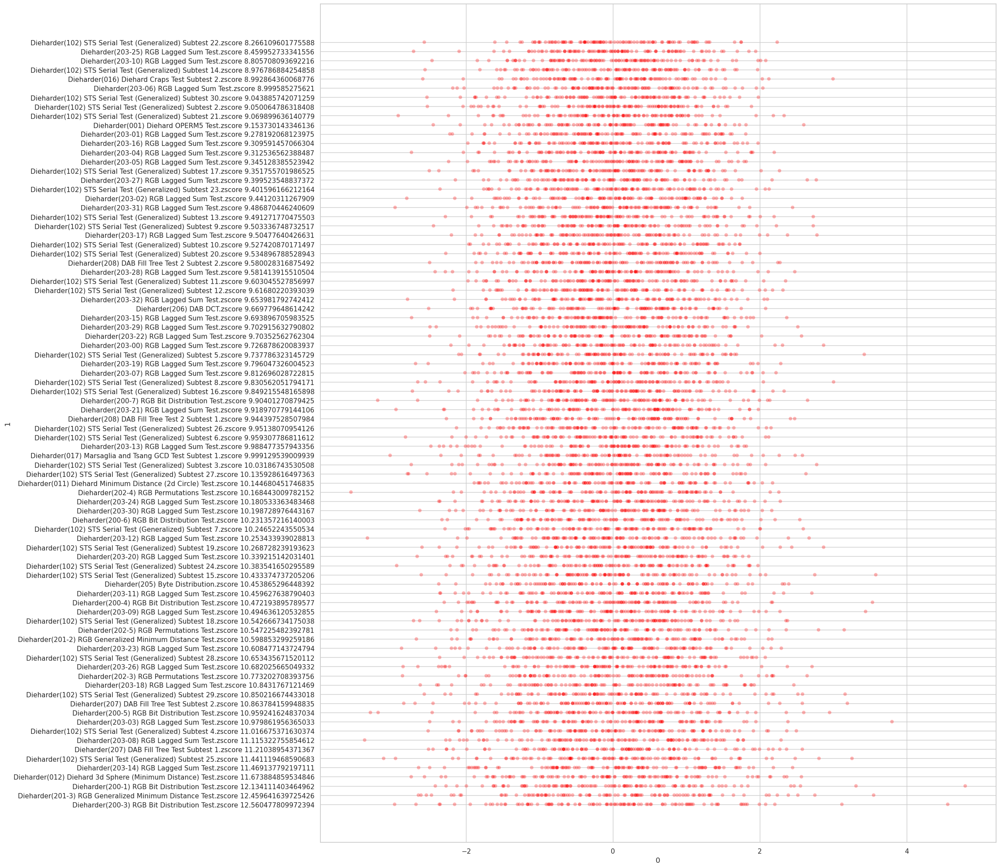

In [40]:
graph_battery_sns(dieharder_low, 25)

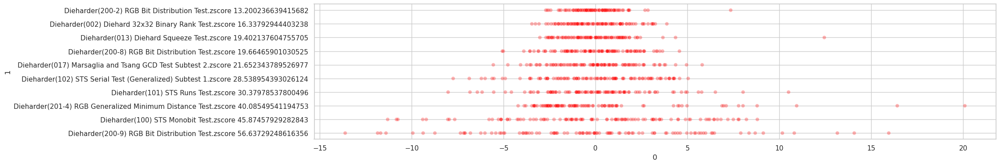

In [41]:
graph_battery_sns(dieharder_mid, 4)

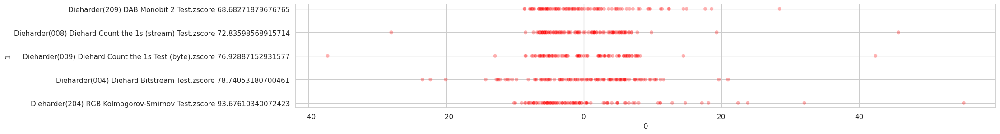

In [42]:
graph_battery_sns(dieharder_midhigh, 3)

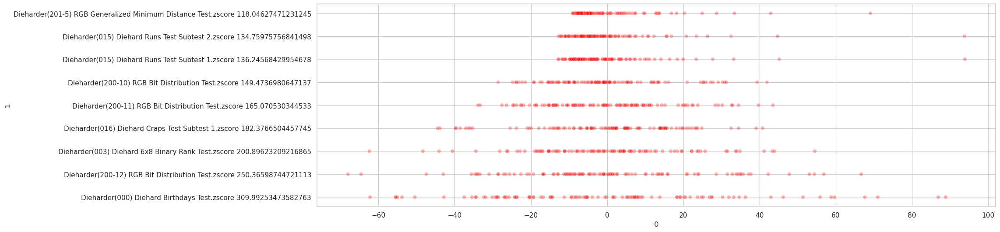

In [43]:
graph_battery_sns(dieharder_high, 6)

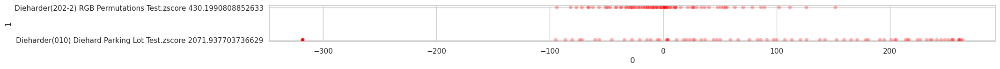

In [44]:
graph_battery_sns(dieharder_highest, 1)

In [4]:
nist = sort_battery(load_battery("nist"))

nist_low = slice_battery(nist, 0, 19.9)
nist_midlow = slice_battery(nist, 19.9, 24)
nist_submid = slice_battery(nist, 24, 41)
nist_mid = slice_battery(nist, 41, 47)
nist_midhigh = slice_battery(nist, 47, 67 )
nist_subhigh = slice_battery(nist, 69, 170)
nist_high = slice_battery(nist, 170, 10000)

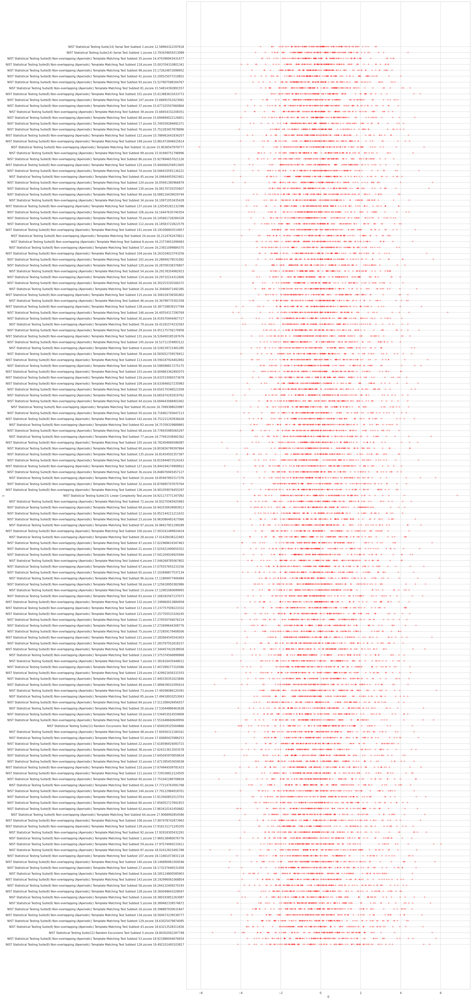

In [5]:
graph_battery_sns(nist_low, 70)

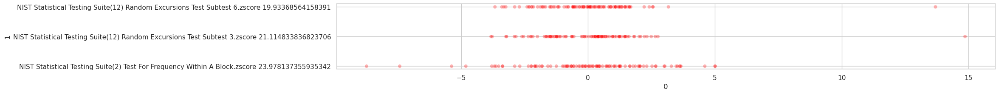

In [6]:
graph_battery_sns(nist_midlow, 2)

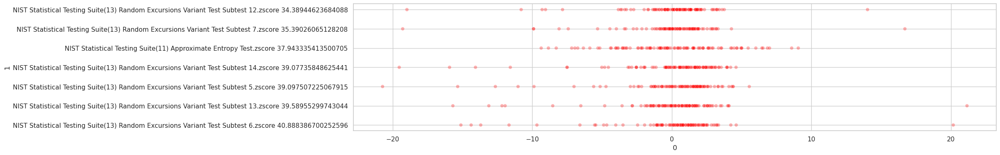

In [7]:
graph_battery_sns(nist_submid, 4)

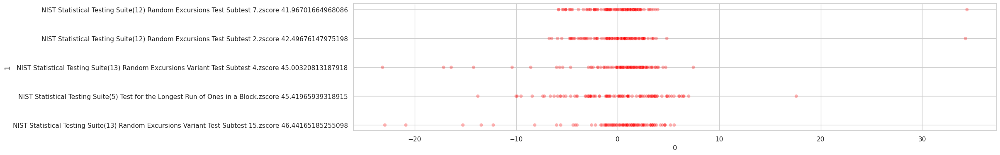

In [8]:
graph_battery_sns(nist_mid, 4)

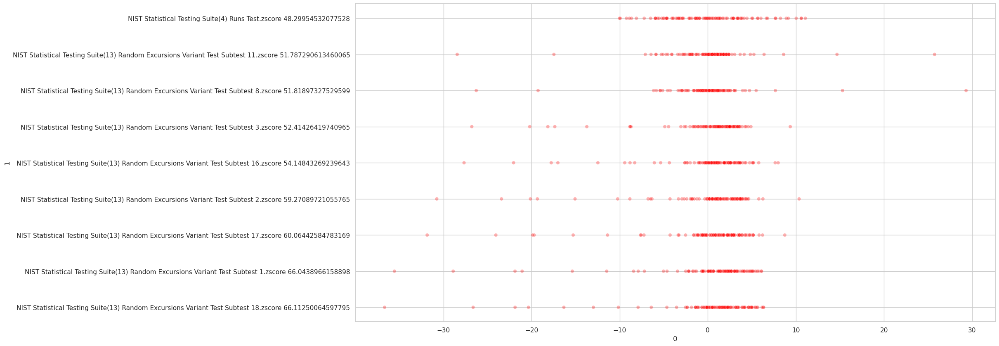

In [9]:
graph_battery_sns(nist_midhigh, 10)

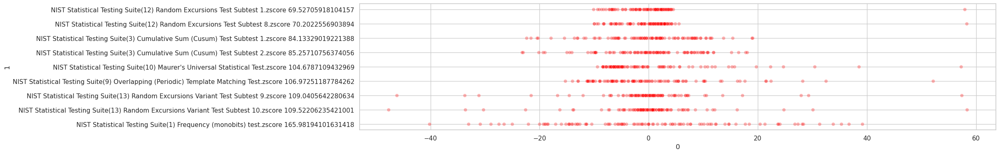

In [10]:
graph_battery_sns(nist_subhigh, 4)

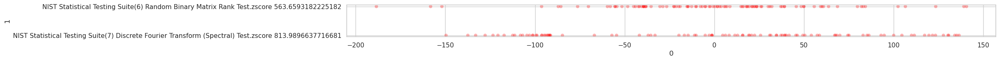

In [11]:
graph_battery_sns(nist_high, 1)

In [53]:
smallcrush = sort_battery(load_battery("testu01-smallcrush"))

smallcrush_low = slice_battery(smallcrush, 0, 13)
smallcrush_mid = slice_battery(smallcrush, 13, 140)
smallcrush_high = slice_battery(smallcrush, 140, 10000)

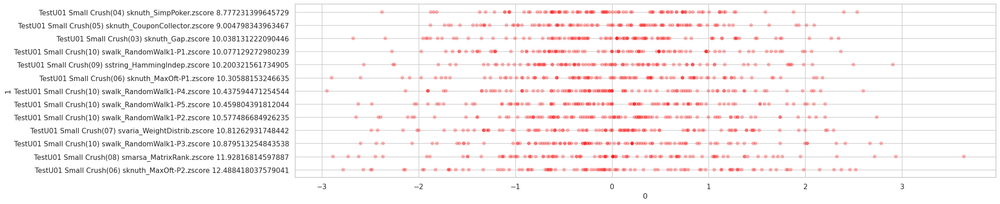

In [54]:
graph_battery_sns(smallcrush_low, 5)

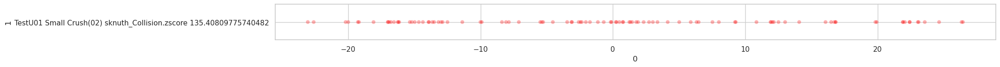

In [55]:
graph_battery_sns(smallcrush_mid, 1)

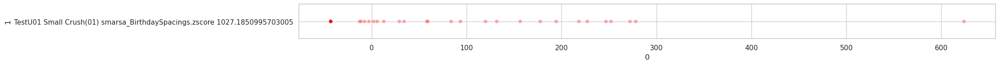

In [56]:
graph_battery_sns(smallcrush_high, 1)

In [112]:
crush = sort_battery(load_battery("testu01-crush"))

crush_low = slice_battery(crush, 0, 14)
crush_uplow = slice_battery(crush, 14,  17)
crush_submid = slice_battery(crush, 17, 50)
crush_mid = slice_battery(crush, 50, 100)
crush_midhigh = slice_battery(crush, 100, 160)
crush_high = slice_battery(crush, 160, 10000)

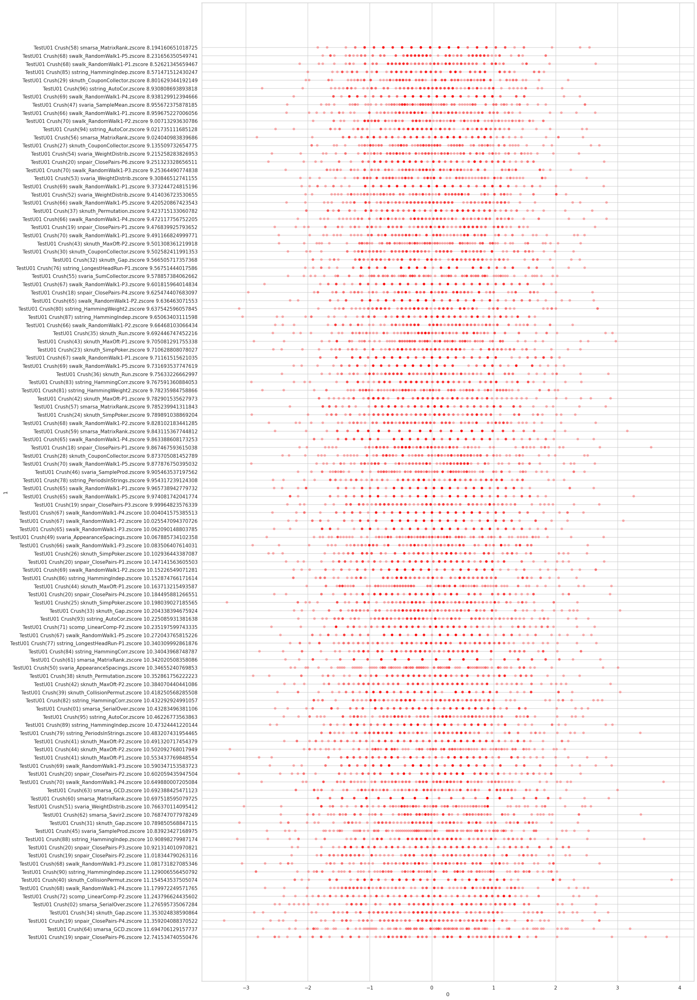

In [113]:
graph_battery_sns(crush_low, 40)

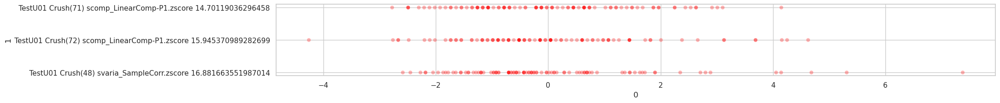

In [114]:
graph_battery_sns(crush_uplow, 2)

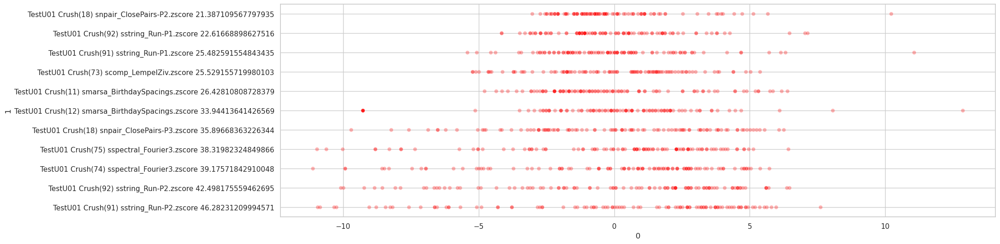

In [110]:
graph_battery_sns(crush_submid, 6)

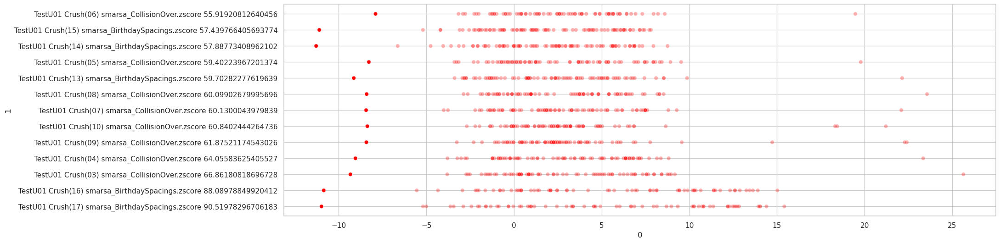

In [111]:
graph_battery_sns(crush_mid, 6)

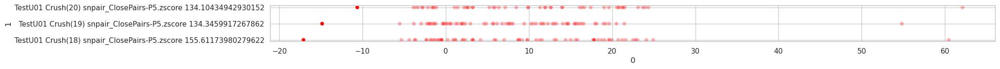

In [60]:
graph_battery_sns(crush_midhigh, 1)

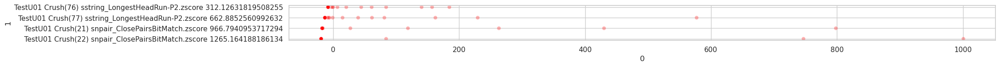

In [61]:
graph_battery_sns(crush_high, 1)

In [105]:
rabbit = sort_battery(load_battery("testu01-rabbit"))

rabbit_low = slice_battery(rabbit, 0, 14)
rabbit_uplow = slice_battery(rabbit, 14,17)
rabbit_submid = slice_battery(rabbit, 17, 260)
rabbit_mid = slice_battery(rabbit, 260, 1000)
rabbit_subhigh = slice_battery(rabbit, 1000, 2000)
rabbit_high = slice_battery(rabbit, 2000, 10000)

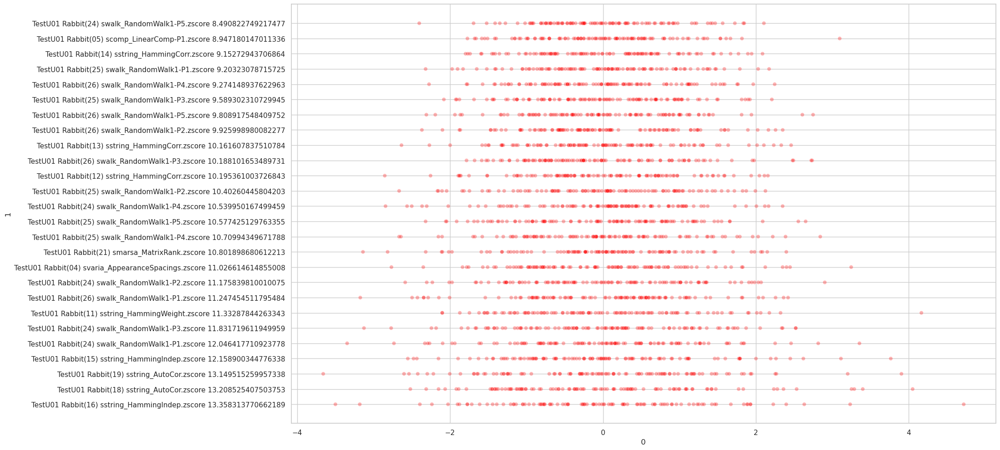

In [106]:
graph_battery_sns(rabbit_low, 12)

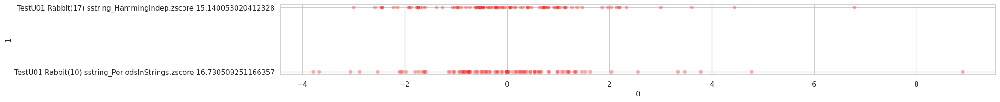

In [107]:
graph_battery_sns(rabbit_uplow, 2)

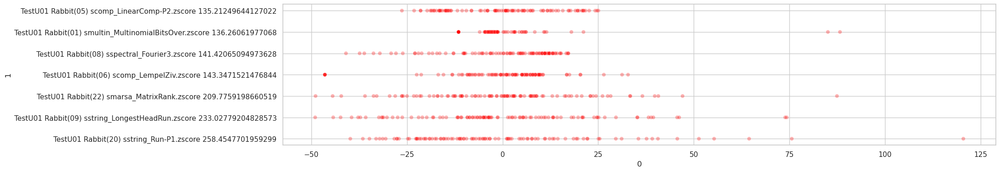

In [98]:
graph_battery_sns(rabbit_submid, 4)

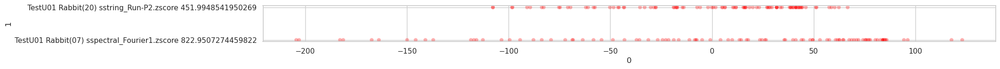

In [101]:
graph_battery_sns(rabbit_mid, 1)

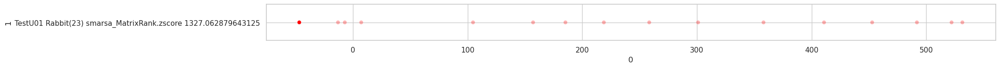

In [102]:
graph_battery_sns(rabbit_subhigh, 1)

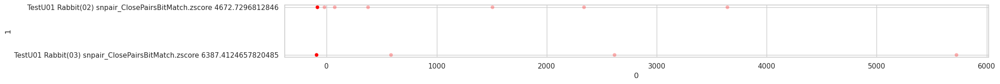

In [103]:
graph_battery_sns(rabbit_high, 1.5)

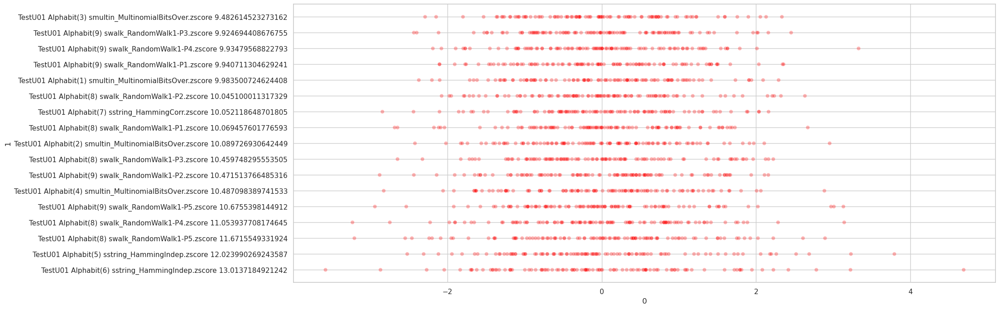

In [65]:
alphabit = sort_battery(load_battery("testu01-alphabit"))
graph_battery_sns(alphabit, 8)

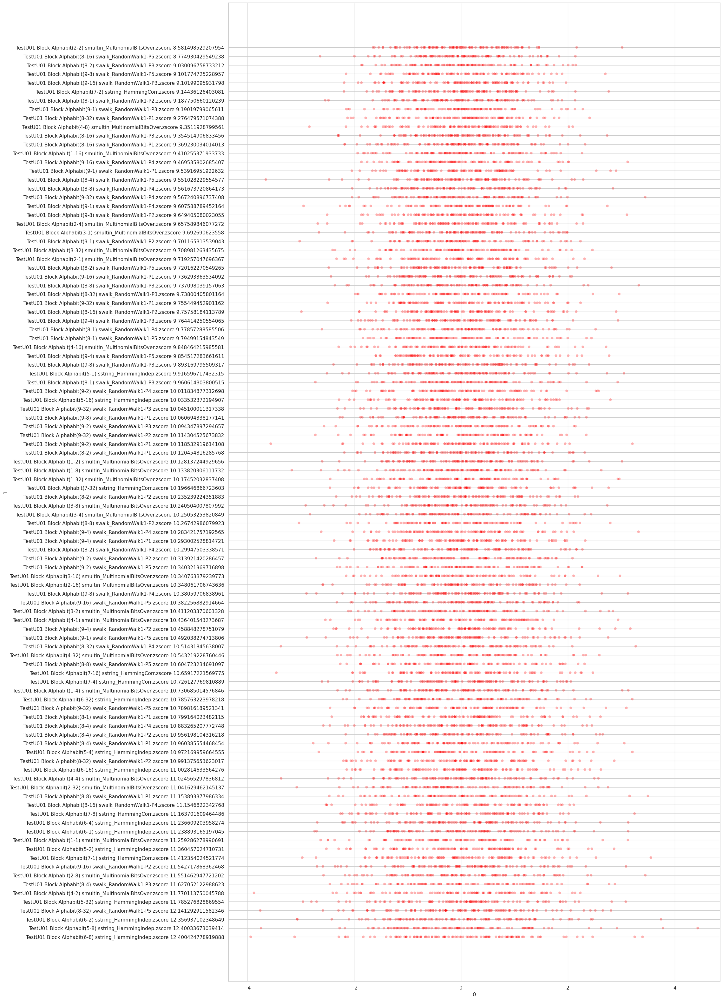

In [66]:
blockalphabit = sort_battery(load_battery("testu01-blockalphabit"))
graph_battery_sns(blockalphabit, 40)